# Task 6.2: Exploring Relationships (NHL Player Stats Project)

### The script contain the following points:

1a)Importing libraries to computer (Pandas, NumPy, OS, Matplotlib, and Seaborn)

1b)Importing Data to Notebook / Turning Project Folder Path Into a String (NHL Players Dataset)

2)Data Check

3)Exploring Relationships

4)Scatterplot

5)Pair Plot

6)Categorial Plot

7)Answers to Questions/New Questions

8)Hypothesis

## 1a.Importing libraries to computer (Pandas, NumPy, OS, Matplotlib, and Seaborn)

In [1]:
# Import libraries

import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns

## 1b. Importing Data to Notebook / Turning Project Folder Path Into a String (NHL Players Dataset)

In [2]:
# Creating a data importing shortcut called 'path' for the NHL project folder to make importing data easier and cleaner
path =r'/Users/drewsmith/Desktop/NHL Player Stats Analysis'

In [3]:
# Utilizing the newly created 'path' shortcut to import the 'NHL Player Data' dataset
nhl_df = pd.read_csv(os.path.join(path, '02 Data', 'Prepared Data', 'NHL_players.csv'), index_col = False)

In [4]:
#Checking version of matplotlib
matplotlib.__version__

'3.6.2'

In [5]:
# This option ensures the charts you create are displayed in the notebook without the need to "call" them specifically.
%matplotlib inline

## 2.Data Check

In [6]:
# Noticed the import of this dataframe added a new unnecessary column
nhl_df.shape

(12270, 29)

In [7]:
# Dropping this column since it is unnecessary 
nhl_df = nhl_df.drop(columns = ['Unnamed: 0'])

In [14]:
nhl_df.head()

,Season,Rank,Player,Age,Position,Team,Games_Played,Goals,Assists,Points,Plus_Minus,Penalty_Minutes,Point_Shares,Even_Strength_Goals,Powerplay_Goals,Shorthanded_Goals,Game_Winning_Goals,Shots,Shooting_Percentage,Time_On_Ice,Avg_Time_On_Ice,Blocks,Hits,Faceoff_Wins,Faceoff_Losses,Faceoff_Percentage,Hart_Trophy?,Votes
0,2017,1,Connor McDavid\mcdavco01,20,C,EDM,82,30,70,100,27,26,12.8,26,3,1,6,251,12.0,1733,21.133333,29.0,34,348.0,458.0,43.2,Yes,1604
1,2017,2,Sidney Crosby\crosbsi01,29,C,PIT,75,44,45,89,17,24,12.3,30,14,0,5,255,17.3,1491,19.883333,27.0,80,842.0,906.0,48.2,No,1104
2,2017,3,Patrick Kane\kanepa01,28,RW,CHI,82,34,55,89,11,32,10.8,27,7,0,5,292,11.6,1754,21.400000,15.0,28,7.0,44.0,13.7,No,206
3,2017,4,Nicklas Backstrom\backsni02,29,C,WSH,82,23,63,86,17,38,9.9,15,8,0,5,162,14.2,1497,18.266667,33.0,45,685.0,648.0,51.4,No,60
4,2017,5,Nikita Kucherov\kucheni01,23,RW,TBL,74,40,45,85,13,38,12.0,23,17,0,7,246,16.3,1438,19.433333,20.0,30,0.0,0.0,0.0,No,119


In [9]:
# No mixed-type columns
for col in nhl_df.columns.tolist():
      weird = (nhl_df[[col]].applymap(type) != nhl_df[[col]].iloc[0].apply(type)).any(axis = 1)
      if len (nhl_df[weird]) > 0:
        print (col) 

## 3. Exploring Relationships

### Correlation Heatmaps

In [12]:
# Doesn't assign any options to the max number of columns so functions can display all columns
pd.options.display.max_columns = None

In [50]:
# Creating subset with only variables I need based on my questions in the previous task 
nhl_sub = nhl_df[['Season','Player','Age','Position','Team','Goals','Assists','Points','Penalty_Minutes','Shorthanded_Goals','Shots','Time_On_Ice','Hits','Hart_Trophy?']]

In [51]:
# Create a correlation matrix using pandas
nhl_sub.corr()

/var/folders/by/p0t5wv1j2qvg4mtq169k6zsr0000gn/T/ipykernel_16646/2810154485.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  nhl_sub.corr()


,Season,Age,Goals,Assists,Points,Penalty_Minutes,Shorthanded_Goals,Shots,Time_On_Ice,Hits
Season,1.000000,-0.068790,-0.029298,-0.043458,-0.039961,-0.199823,-0.060544,-0.005470,-0.015928,0.307924
Age,-0.068790,1.000000,0.102468,0.176285,0.155130,0.203711,0.060717,0.152163,0.250589,0.083616
Goals,-0.029298,0.102468,1.000000,0.777609,0.917481,0.270773,0.384620,0.885587,0.625710,0.195590
Assists,-0.043458,0.176285,0.777609,1.000000,0.963544,0.313503,0.258787,0.849953,0.803870,0.197058
Points,-0.039961,0.155130,0.917481,0.963544,1.000000,0.313559,0.327388,0.914564,0.774825,0.207898
Penalty_Minutes,-0.199823,0.203711,0.270773,0.313503,0.313559,1.000000,0.126225,0.370465,0.462984,0.409268
Shorthanded_Goals,-0.060544,0.060717,0.384620,0.258787,0.327388,0.126225,1.000000,0.336445,0.266894,0.080304
Shots,-0.005470,0.152163,0.885587,0.849953,0.914564,0.370465,0.336445,1.000000,0.817587,0.325923
Time_On_Ice,-0.015928,0.250589,0.625710,0.803870,0.774825,0.462984,0.266894,0.817587,1.000000,0.427737
Hits,0.307924,0.083616,0.195590,0.197058,0.207898,0.409268,0.080304,0.325923,0.427737,1.000000


/var/folders/by/p0t5wv1j2qvg4mtq169k6zsr0000gn/T/ipykernel_16646/1118630547.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  plt.matshow(nhl_sub.corr())


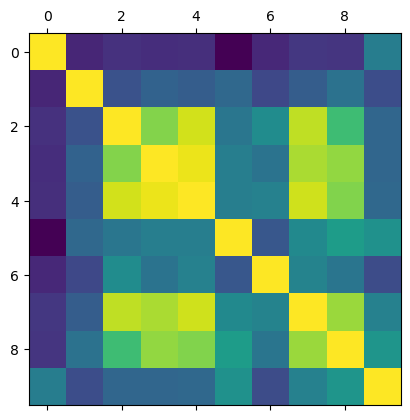

In [65]:
# Create a correlation heatmap using matplotlib and saves figure
plt.matshow(nhl_sub.corr())
plt.savefig("heatmap1.png") 

In [15]:
#Shows current directory
cwd = os.getcwd()
cwd

'/Users/drewsmith/NHL Project (MODULE 6)'

/var/folders/by/p0t5wv1j2qvg4mtq169k6zsr0000gn/T/ipykernel_16646/4114252511.py:4: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  plt.matshow(nhl_sub.corr(), fignum=f.number) # type of plot


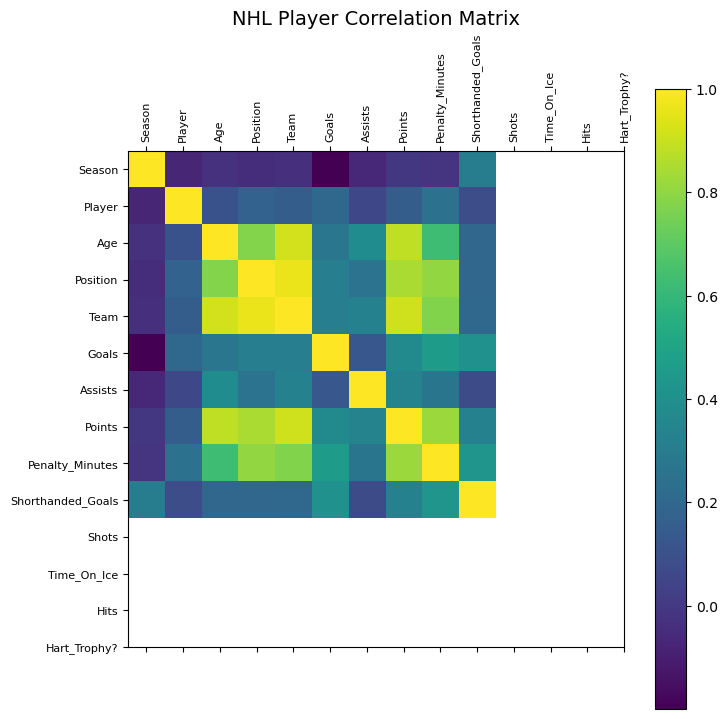

In [74]:
# Add labels, a legend, and change the size of the heatmap

f = plt.figure(figsize=(8, 8)) # figure size 
plt.matshow(nhl_sub.corr(), fignum=f.number) # type of plot
plt.xticks(range(nhl_sub.shape[1]), nhl_sub.columns, fontsize=8, rotation=90) # x axis labels
plt.yticks(range(nhl_sub.shape[1]), nhl_sub.columns, fontsize=8) # y axis labels
cb = plt.colorbar() # add a colour legend (called colorbar)
cb.ax.tick_params(labelsize=10) # add font size
plt.title('NHL Player Correlation Matrix', fontsize=14) # add title
plt.savefig("heatmaplabeled.png") 

#### Not sure why the graph isn't filling up the whole axis. I tried playing around with the numbers in the command above but it didn't adjust.

/var/folders/by/p0t5wv1j2qvg4mtq169k6zsr0000gn/T/ipykernel_16646/1248855131.py:5: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = sns.heatmap(nhl_sub.corr(), annot = True, ax = ax) # The `annot` argument allows the plot to


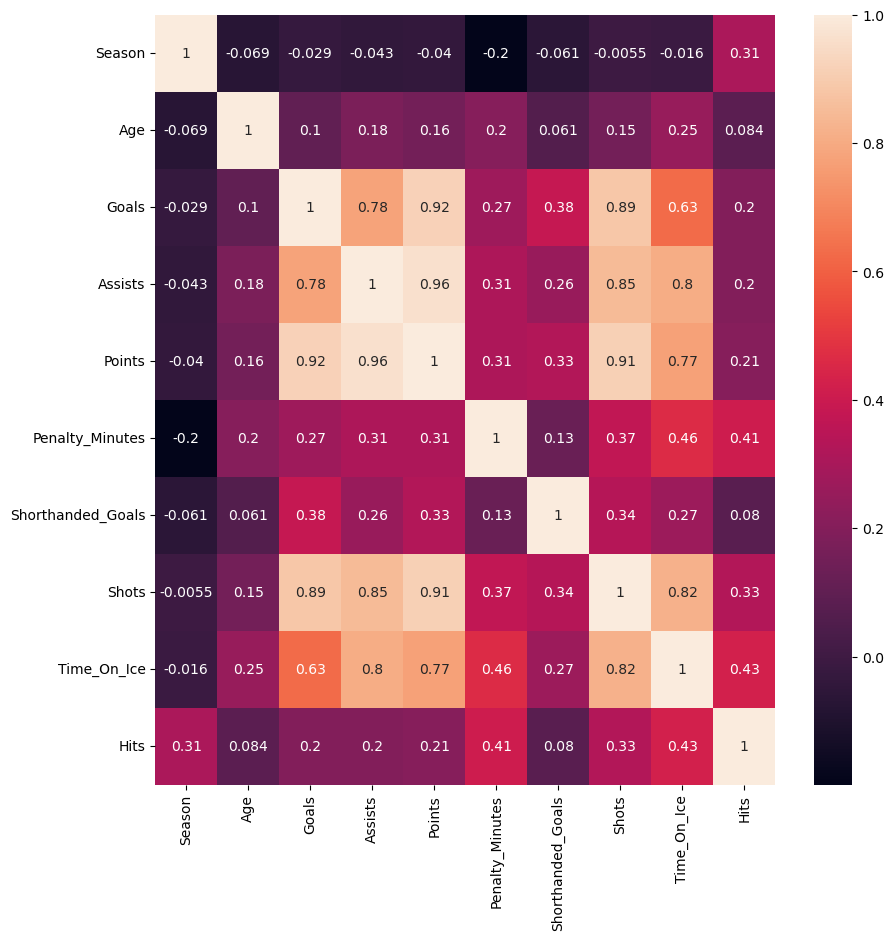

In [73]:
# Create a subplot with matplotlib
f,ax = plt.subplots(figsize=(10,10))

# Create the correlation heatmap in seaborn by applying a heatmap onto the correlation matrix and the subplots defined above.
corr = sns.heatmap(nhl_sub.corr(), annot = True, ax = ax) # The `annot` argument allows the plot to 
#place the correlation coefficients onto the heatmap.
plt.savefig("heatmapseaborn.png") 

### Answer: In the correlation matrix heatmap, the higher the coefficient is, the higher the indication of a stronger postitive correlation. Vice versa with the lower the coefficient, the higher the inidication of a weaker negative correlation. For example, when comparing the 'season' variable to others, based on the heatmap every column indicates a weak negative correlation with the season other than hits with a moderate positive correlation. This provides the insight that hitting in the NHL has changed over time since nowadays the game is more skillful rather than rough like in the past.

## 04.Scatterplot

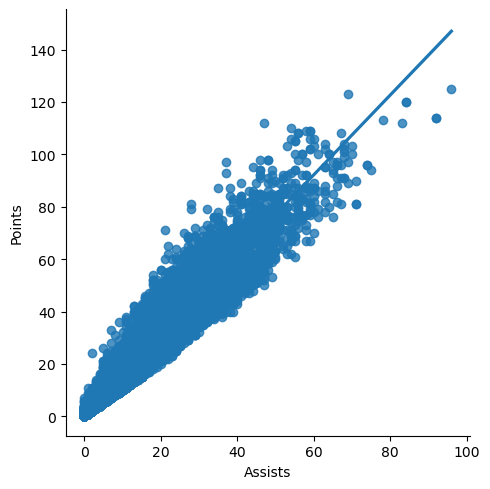

In [76]:
# Create a scatterplot for the "Assists" and "Points" columns in seaborn
sns.lmplot(x = 'Assists', y = 'Points', data = nhl_df)
plt.savefig('scatterplot')

### Answer: In the heatmap, assists and points had the strongest correlation with 0.96 and the scatterplot shows a very positive relationship between the two variables. It's apparent that the players are more likely to get a majority of assists rather than goals in their total point count in a season. As well as the obvious, the more assists a player gets, the more points he will get in a season. The inputs fall pretty close to the trend line, however there are a few outliers but that is likely due to players who either score more goals than assists or get far more assists than goals in a season.

## 05. Pair Plot

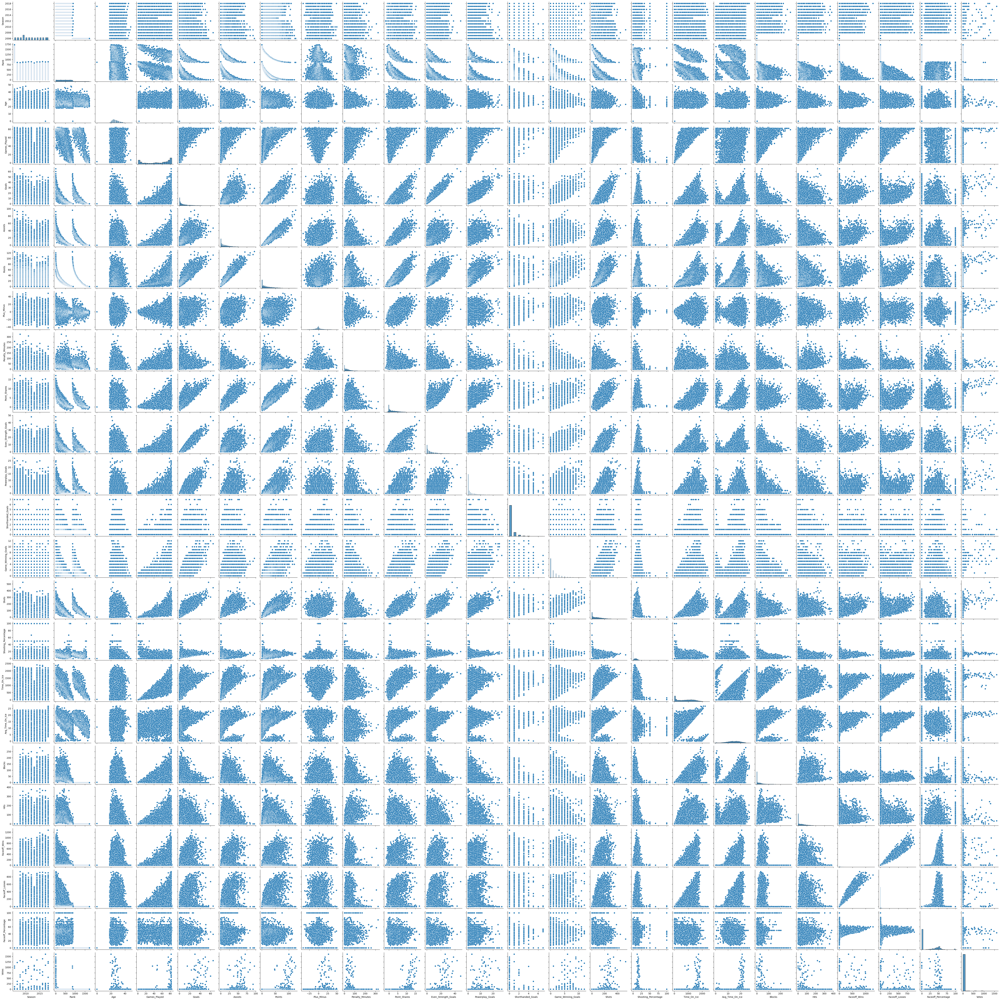

In [77]:
# Create a pair plot 
pair = sns.pairplot(nhl_df)
plt.savefig('pairplot')

### Answer: I saved an image of this to look at each graph more in detail. There was a ton of variables in my dataset and this is a lot to look at. To summarize many of the graphs, the majority of the league will be clustered together in most categories like goals, assists, points,penalties, hits, etc and there will be outliers in every category due to certain playstyles or different talents that produce more or less in various statistics than the majority of the league. Some graphs have a straight line or staright row of dots in a direction due to a player not having any statistics in that category due to position or games played. 

### Regarding which variables I would like to further explore, I would like to analyze hits and penalty minutes by season since there is a fluctionation in each category every season. I wonder if rules have changed the outcomes of these variables or if the game itself has changed. 

## 06. Categorial Plot

<AxesSubplot: xlabel='Time_On_Ice', ylabel='Count'>

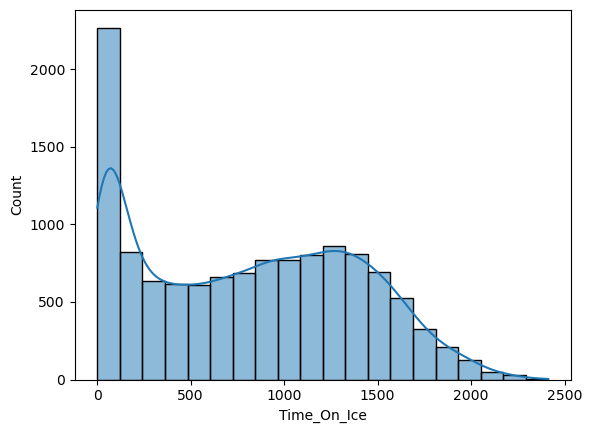

In [81]:
# Use a histogram to visualize the distribution of the variables. 
# This way, you can determine sensible categories for the time_on_ice ranges. 
# You don't want to end up with too few observations in any one of the categories.
# The argument "kde" add a line that encompasses the distribution

sns.histplot(nhl_df['Time_On_Ice'], bins = 20, kde = True)

In [118]:
# Creating a new variable that divides players time_on_ice into categories of playtime in a season
nhl_df.loc[nhl_df['Time_On_Ice'] <= 0, 'Playtime_Status'] = 'Didnt Play'

In [119]:
nhl_df.loc[(nhl_df['Time_On_Ice'] >= 1) & (nhl_df['Time_On_Ice'] < 500), 'Playtime_Status'] = 'Little Playtime'

In [120]:
nhl_df.loc[(nhl_df['Time_On_Ice'] >= 500) & (nhl_df['Time_On_Ice'] < 1000), 'Playtime_Status'] = 'Average Playtime'

In [121]:
nhl_df.loc[(nhl_df['Time_On_Ice'] >= 1000) & (nhl_df['Time_On_Ice'] < 1500), 'Playtime_Status'] = 'Lots of Playtime'

In [122]:
nhl_df.loc[nhl_df['Time_On_Ice'] >= 1500, 'Playtime_Status'] = 'Top Minutes'

In [123]:
nhl_df['Playtime_Status'].value_counts(dropna = False)

Little Playtime     4417
Lots of Playtime    3335
Average Playtime    2865
Top Minutes         1653
Name: Playtime_Status, dtype: int64

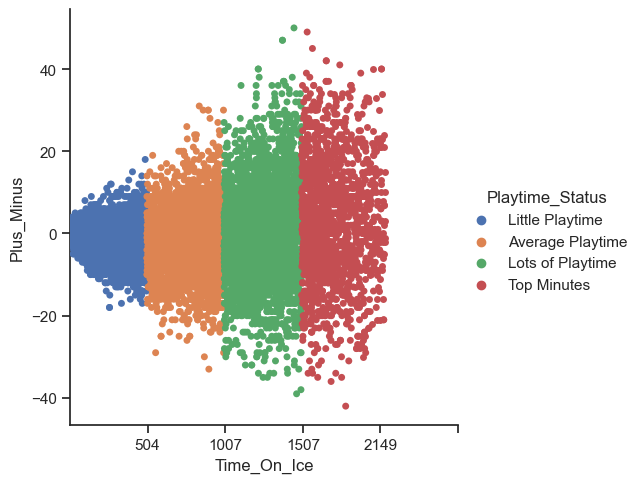

In [126]:
# Create a categorical plot in seaborn using the playtime_status categories created above
sns.set(style="ticks")
cat_plot = sns.catplot(x="Time_On_Ice", y="Plus_Minus", hue="Playtime_Status", data=nhl_df)
plt.xticks([500, 1000, 1500, 2000, 2500])
plt.savefig('catplot')

#### Not sure why the tick marks are showing numbers a little bit off than what I assigned them on x axis.

### Answer: Based on the results, the less time on ice a player has, the more likely the player is to be around an even (0) plus minus. The more time on ice a player gets, the higher the fluctuation in plus minus he can have. That means some players get scored on a lot while they are on the ice and some players are on the ice a lot for their own teams scores. 

## 07. Answers to Questions/New Questions

#### Questions I have been able to somewhat answer
2)Is there a correlation between which players are most likely to score short-handed goals?
Yes,the more shots,goals, and points increases the likelyhood of a player scoring more short-handed goals.

3)Does age or position impact which players have the highest/lowest time on ice?
Yes, age does slightly factor into what causes a player to have more or less time on ice. I don't know the specifics of which ages yet. 

4)Is the number of shots a player takes in a year directly correlated to a higher goal total?
Yes, there is a strong positive correlation between more shot totals and higher goal totals.

6)Is there a correlation between higher hit totals and penalty minutes? 
There is a moderate positive correlation between hits and penalty minutes. Likely due to hits that have crossed the line or accidental injuries caused to another player.

#### New Questions
1)How much do powerplay goals make up of the total points for top minute/lots of playtime players?

2)What are the main factors to causing a very high or low plus minus?

3)Does time impact shooting percentage? (to see if goalies have an impact?) 

## 08. Hypothesis

1)Most players with the highest and lowest plus minuses will be defenseman.

2)Teams in the western conference will have higher hit and penalty minute totals than the eastern conference.

3)The teams with the most blocked shots will have the most shorthanded goals.

4)The majority of hart trophy votes will go to centermen.